In [17]:
import os
data_dir = os.listdir("dataset")
print(data_dir)

['cat', 'dog']


In [18]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from tensorflow.keras.applications.vgg16 import decode_predictions, VGG16, preprocess_input
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
import numpy as np
import tensorflow as tf

In [19]:
train_datasets = "dataset"
test_datasets = "dataset"

In [20]:
image_size = (150, 150)
number_class = len(data_dir)
batch_size = 10
number_epochs = 10
learning_rate = 0.001

In [21]:
# Data Augmentation
train_dataset_generator = ImageDataGenerator(rescale = 1./255,
                                            rotation_range = 45,
                                            featurewise_center = True,
                                            featurewise_std_normalization = True,
                                            height_shift_range=0.2,
                                            width_shift_range=0.2,
                                            shear_range = 0.2,
                                            zoom_range = 0.2,
                                            channel_shift_range = 20,
                                            horizontal_flip = True,
                                            vertical_flip = True,
                                            validation_split = 0.2, 
                                            fill_mode="constant")

In [22]:
train_batches = train_dataset_generator.flow_from_directory(train_datasets,
                                                           target_size= image_size,
                                                           shuffle=True,
                                                           batch_size=batch_size,
                                                           subset='training',
                                                           seed=42,
                                                           class_mode = "binary")

Found 80 images belonging to 2 classes.


In [23]:
validation_batches = train_dataset_generator.flow_from_directory(train_datasets,
                                                           target_size= image_size,
                                                           shuffle=True,
                                                           batch_size=batch_size,
                                                           subset='validation',
                                                           seed=42,
                                                           class_mode = "binary")

Found 20 images belonging to 2 classes.


In [24]:
vgg_model = VGG16(weights="imagenet",
                 include_top = False,
                 input_shape=(150, 150, 3))

vgg_model.trainable = False # vgg16 already trainable by default

In [25]:
model = Sequential()
model.add(vgg_model)
model.add(Flatten())
model.add(Dense(256, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))

In [27]:
model.compile(loss = 'binary_crossentropy',
             optimizer = Adam(learning_rate = learning_rate), 
             metrics = ['accuracy'])

In [28]:
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 8192)              0         
                                                                 
 dense_4 (Dense)             (None, 256)               2097408   
                                                                 
 dense_5 (Dense)             (None, 1)                 257       
                                                                 
Total params: 16,812,353
Trainable params: 2,097,665
Non-trainable params: 14,714,688
_________________________________________________________________
None


In [29]:
print(len(train_batches))
print()
print(len(validation_batches))

8

2


In [30]:
print(train_batches.n)
print()
print(validation_batches.n)

80

20


In [31]:
print(train_batches.batch_size)
print()
print(validation_batches.batch_size)

10

10


In [33]:
train_step_size = train_batches.n // train_batches.batch_size
validation_step_size = validation_batches.n //validation_batches.batch_size

In [34]:
model_runing_history = model.fit(train_batches, 
                                steps_per_epoch = train_step_size,
                                validation_data=validation_batches,
                                validation_steps=validation_step_size,
                                epochs = number_epochs)

C:\Users\karim Suzon\anaconda3\lib\site-packages\keras_preprocessing\image\image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
C:\Users\karim Suzon\anaconda3\lib\site-packages\keras_preprocessing\image\image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/10
8/8 [==============================] - 13s 2s/step - loss: 1.4931 - accuracy: 0.6000 - val_loss: 1.3490 - val_accuracy: 0.5000
Epoch 2/10
8/8 [==============================] - 12s 2s/step - loss: 1.0117 - accuracy: 0.5750 - val_loss: 0.6757 - val_accuracy: 0.6000
Epoch 3/10
8/8 [==============================] - 12s 2s/step - loss: 0.7390 - accuracy: 0.6125 - val_loss: 0.4555 - val_accuracy: 0.7000
Epoch 4/10
8/8 [==============================] - 12s 2s/step - loss: 0.6432 - accuracy: 0.6000 - val_loss: 0.8340 - val_accuracy: 0.5500
Epoch 5/10
8/8 [==============================] - 12s 2s/step - loss: 0.5519 - accuracy: 0.7000 - val_loss: 0.6863 - val_accuracy: 0.6500
Epoch 6/10
8/8 [==============================] - 13s 2s/step - loss: 0.4737 - accuracy: 0.7875 - val_loss: 0.3688 - val_accuracy: 0.8500
Epoch 7/10
8/8 [==============================] - 14s 2s/step - loss: 0.4440 - accuracy: 0.7500 - val_loss: 0.5605 - val_accuracy: 0.7500
Epoch 8/10
8/8 [==================

In [35]:
import matplotlib.pyplot as plt
%matplotlib inline

def accuracy_loss_plot(model_data, epochs):
    
    
    acc = model_runing_history.history['accuracy']
    loss = model_runing_history.history['loss']
    val_acc = model_runing_history.history['val_accuracy']
    val_loss = model_runing_history.history['val_loss']
    
    plt.figure(figsize = (20, 8))
    plt.subplot(121)
    plt.plot(range(1, epochs), acc[1:], label = 'Training Accuracy')
    plt.plot(range(1, epochs), val_acc[1:], label = 'Test Accuracy')
    plt.title("Accuracy Over " + str(epochs) + "Epochs", size = 15)
    plt.legend()
    plt.grid(True)
    
    
    
    plt.figure(figsize = (20, 8))
    plt.subplot(122)
    plt.plot(range(1, epochs), loss[1:], label = 'Training Loss')
    plt.plot(range(1, epochs), val_loss[1:], label = 'Test Loss')
    plt.title("Loss Over " + str(epochs) + "Epochs", size = 15)
    plt.legend()
    plt.grid(True)
    
    plt.show()

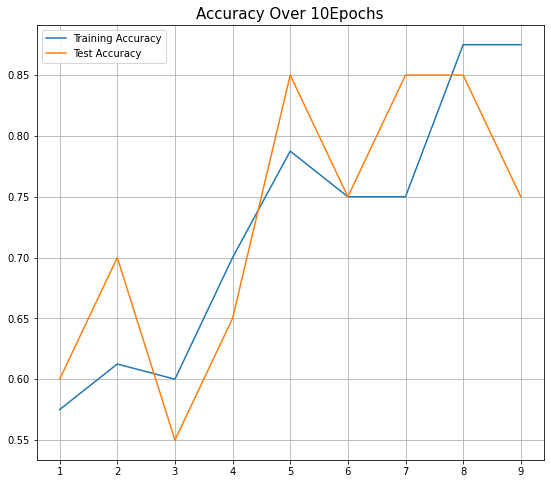

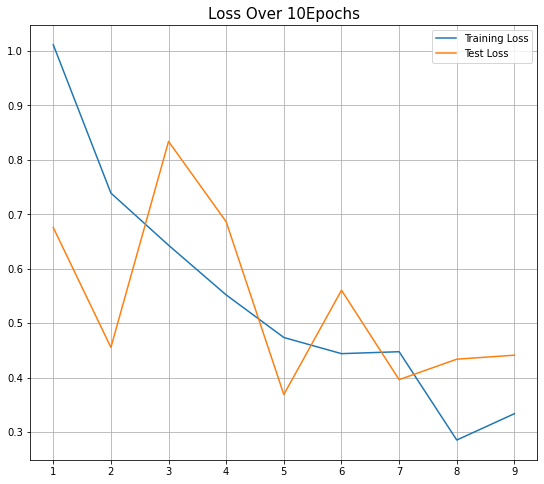

In [36]:
accuracy_loss_plot(model_runing_history, 10)

In [37]:
model.save("ClassificationModel.h5")

In [38]:
test_datagenrator = ImageDataGenerator(rescale=1./255)
test_batches = test_datagenrator.flow_from_directory(test_datasets,
                                       target_size= image_size,
                                       shuffle=False,
                                       batch_size=1,
                                       seed=42,
                                       class_mode = "binary")

test_batches.reset()

Found 100 images belonging to 2 classes.


In [39]:
test_batches.reset()
random_data = model.evaluate(test_batches,
                            steps = int(np.ceil(len(test_batches) / batch_size)), 
                             use_multiprocessing = False,
                            verbose = 1, # kind of representation
                             workers = 1)

10/10 [==============================] - 2s 168ms/step - loss: 0.2802 - accuracy: 0.9000


In [40]:
print("TestDatasets Loss: ", random_data[0])
print("TestDatasets Accuracy: ", random_data[1])

TestDatasets Loss:  0.2802427411079407
TestDatasets Accuracy:  0.8999999761581421


In [41]:
test_batches.reset()
predictted = model.predict(test_batches, 1000, verbose=1)

100/100 [==============================] - 16s 159ms/step


cat\cat.1.jpg


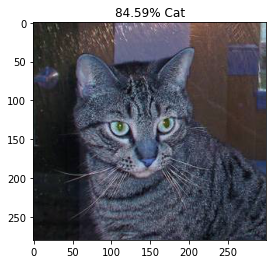

cat\cat.10.jpg


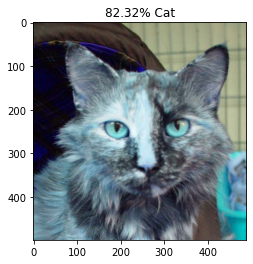

cat\cat.11.jpg


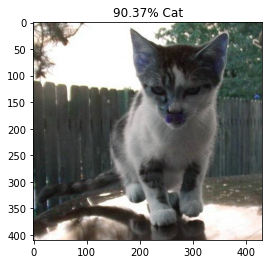

cat\cat.12.jpg


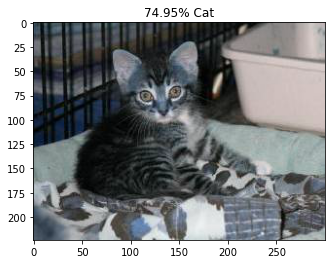

cat\cat.13.jpg


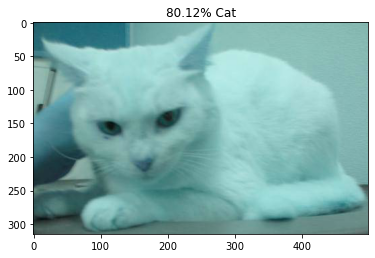

cat\cat.14.jpg


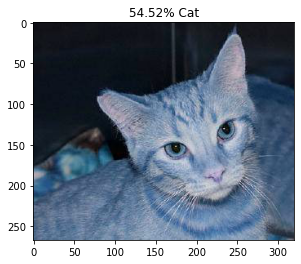

cat\cat.15.jpg


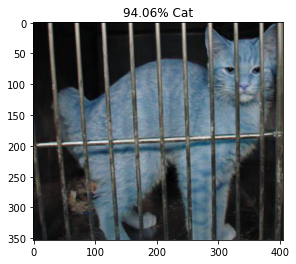

cat\cat.16.jpg


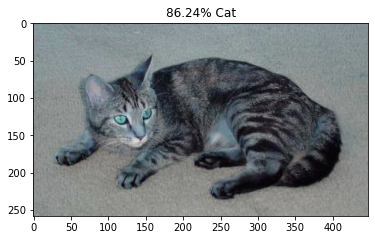

cat\cat.17.jpg


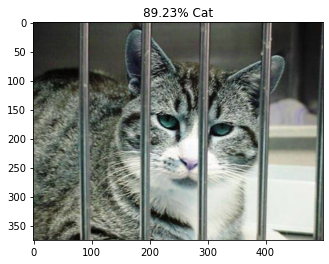

cat\cat.18.jpg


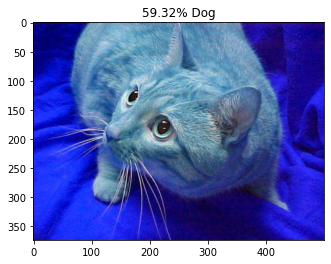

cat\cat.19.jpg


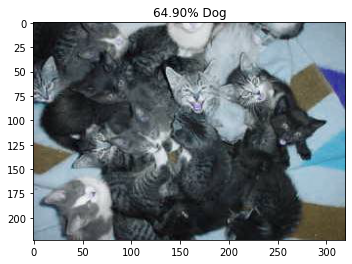

cat\cat.2.jpg


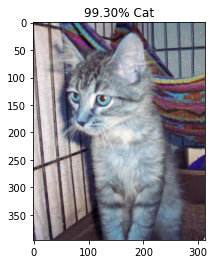

cat\cat.20.jpg


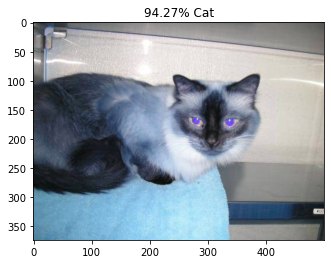

cat\cat.21.jpg


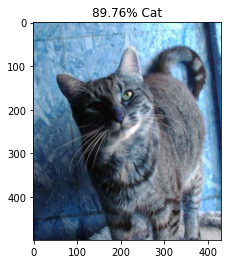

cat\cat.22.jpg


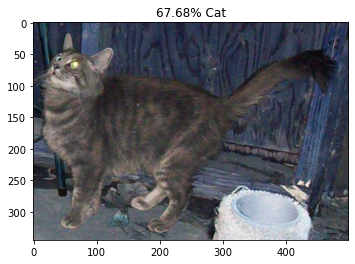

cat\cat.23.jpg


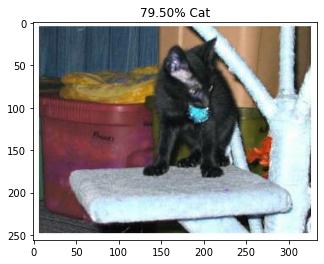

cat\cat.24.jpg


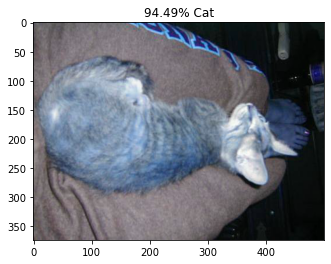

cat\cat.25.jpg


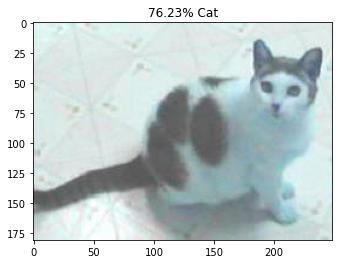

cat\cat.26.jpg


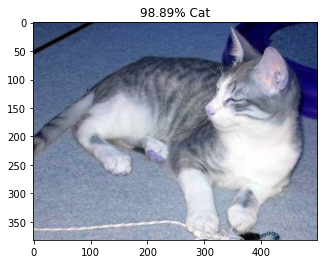

cat\cat.27.jpg


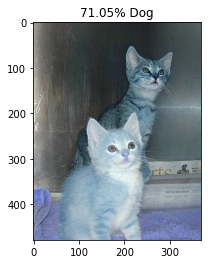

cat\cat.28.jpg


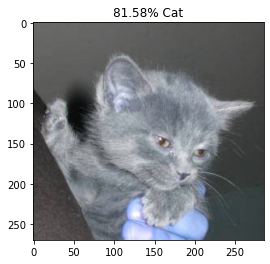

cat\cat.29.jpg


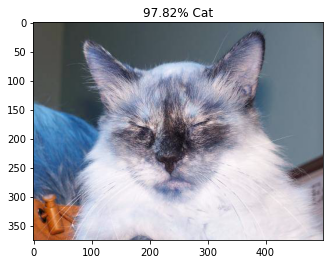

cat\cat.3.jpg


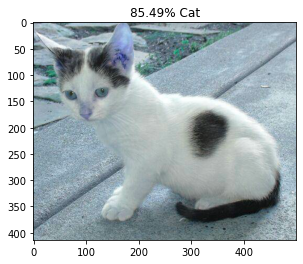

cat\cat.30.jpg


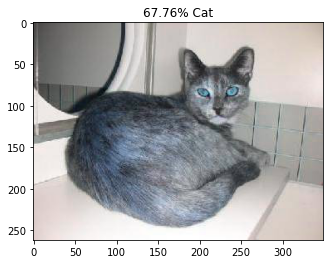

cat\cat.31.jpg


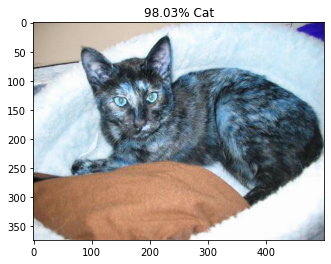

cat\cat.32.jpg


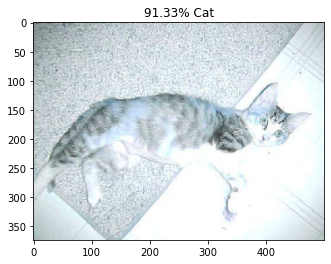

cat\cat.33.jpg


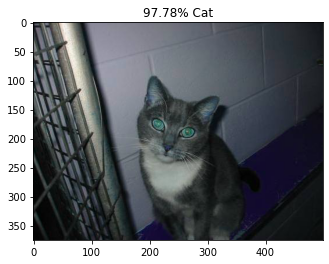

cat\cat.34.jpg


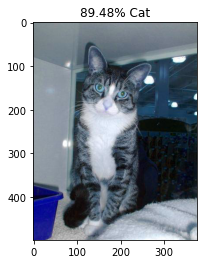

cat\cat.35.jpg


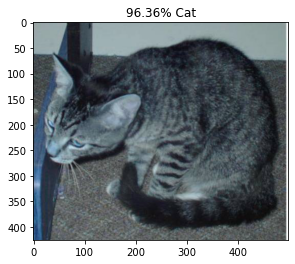

cat\cat.36.jpg


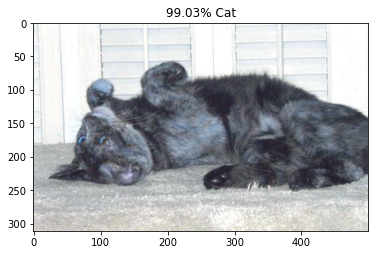

cat\cat.37.jpg


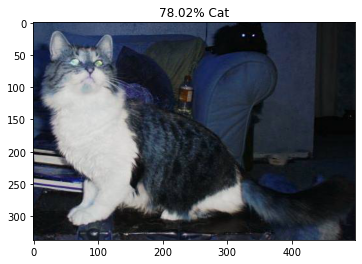

cat\cat.38.jpg


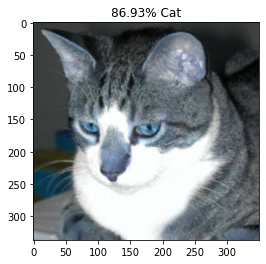

cat\cat.39.jpg


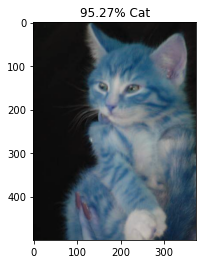

cat\cat.4.jpg


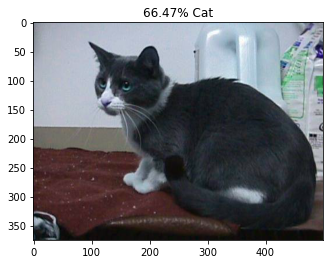

cat\cat.40.jpg


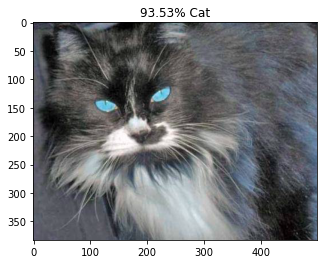

cat\cat.41.jpg


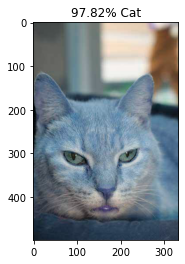

cat\cat.42.jpg


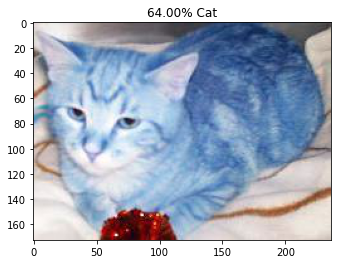

cat\cat.43.jpg


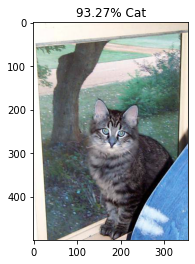

cat\cat.44.jpg


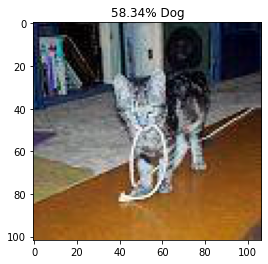

cat\cat.45.jpg


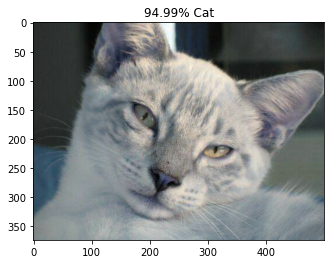

cat\cat.46.jpg


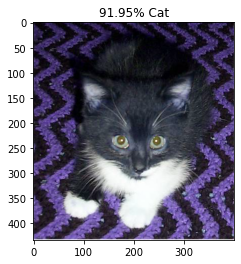

cat\cat.47.jpg


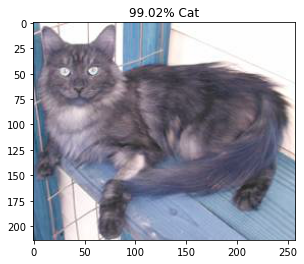

cat\cat.48.jpg


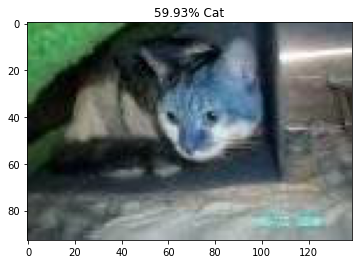

cat\cat.49.jpg


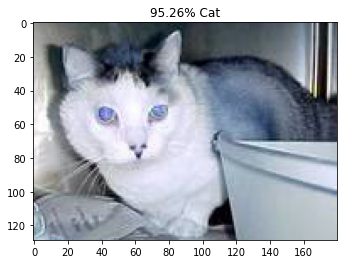

cat\cat.5.jpg


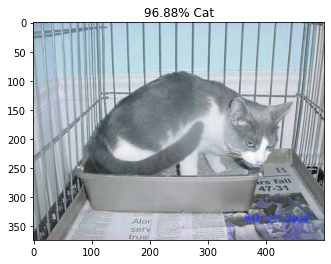

cat\cat.50.jpg


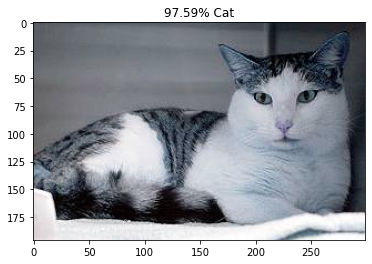

cat\cat.6.jpg


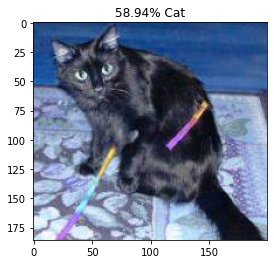

cat\cat.7.jpg


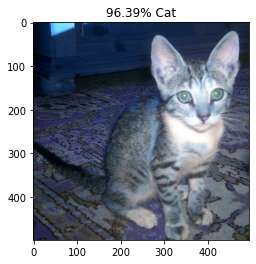

cat\cat.8.jpg


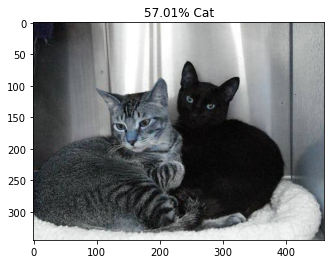

cat\cat.9.jpg


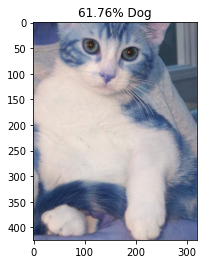

dog\dog.1.jpg


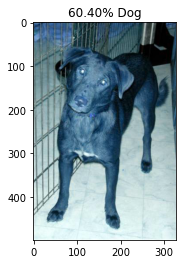

dog\dog.10.jpg


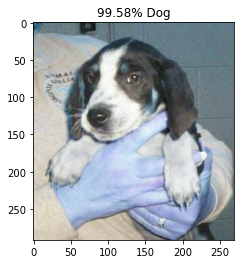

dog\dog.11.jpg


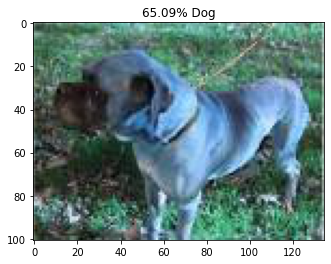

dog\dog.12.jpg


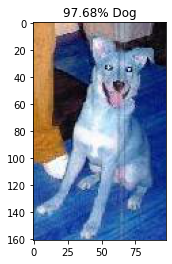

dog\dog.13.jpg


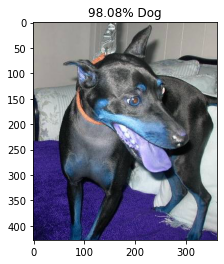

dog\dog.14.jpg


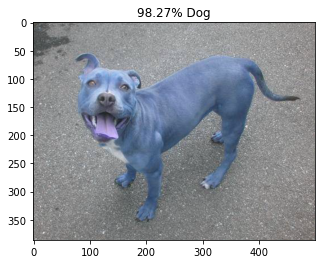

dog\dog.15.jpg


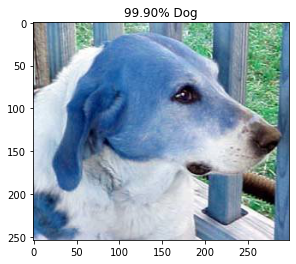

dog\dog.16.jpg


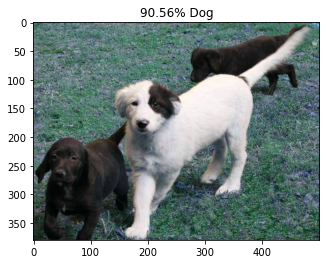

dog\dog.17.jpg


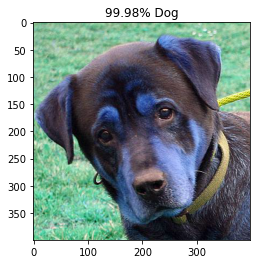

dog\dog.18.jpg


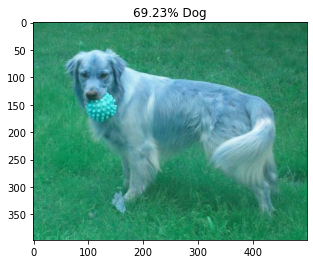

dog\dog.19.jpg


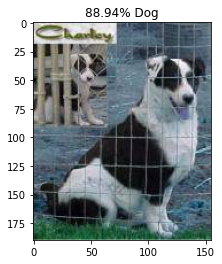

dog\dog.2.jpg


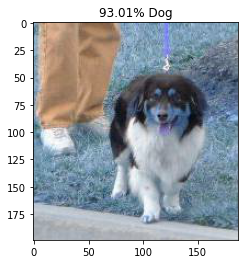

dog\dog.20.jpg


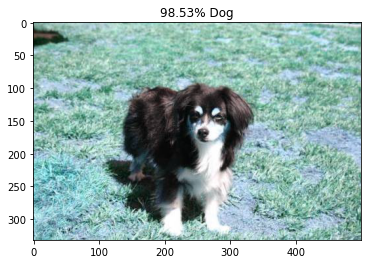

dog\dog.21.jpg


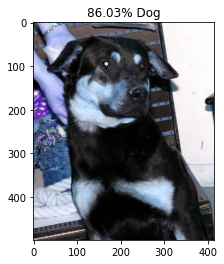

dog\dog.22.jpg


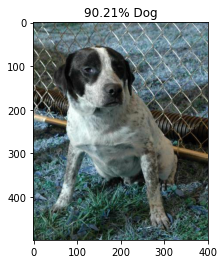

dog\dog.23.jpg


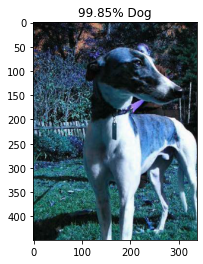

dog\dog.24.jpg


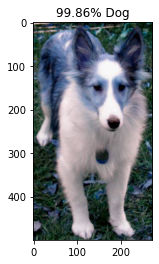

dog\dog.25.jpg


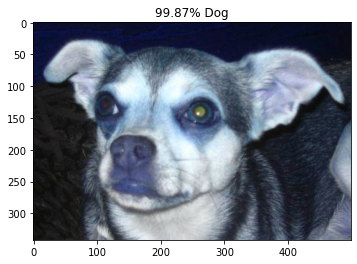

dog\dog.26.jpg


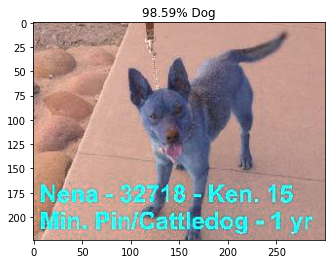

dog\dog.27.jpg


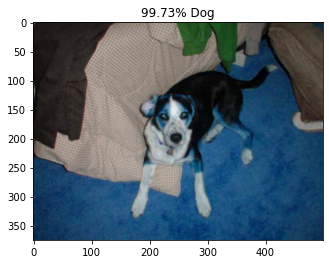

dog\dog.28.jpg


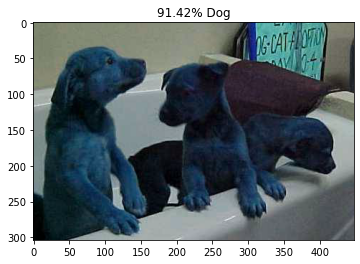

dog\dog.29.jpg


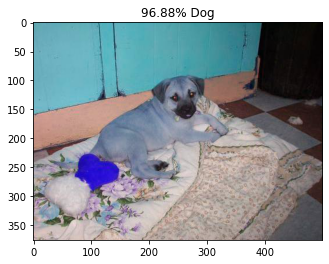

dog\dog.3.jpg


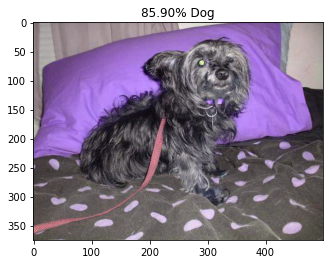

dog\dog.30.jpg


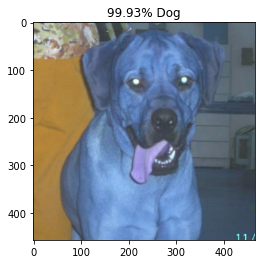

dog\dog.31.jpg


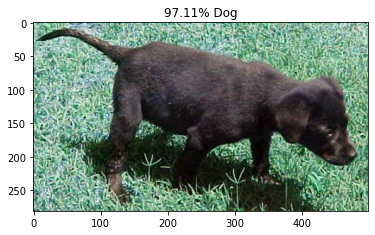

dog\dog.32.jpg


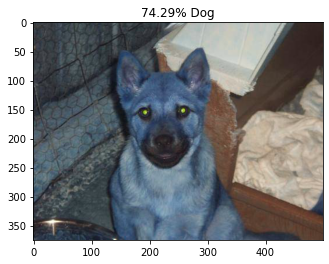

dog\dog.33.jpg


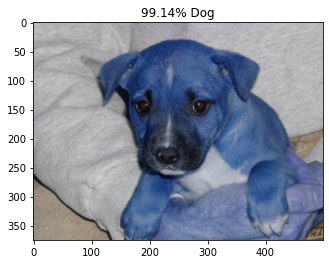

dog\dog.34.jpg


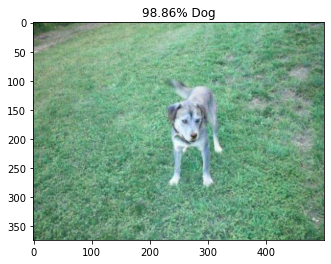

dog\dog.35.jpg


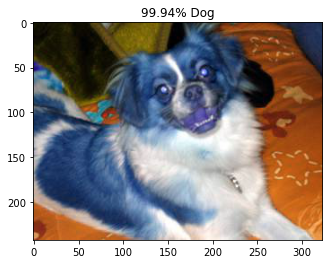

dog\dog.36.jpg


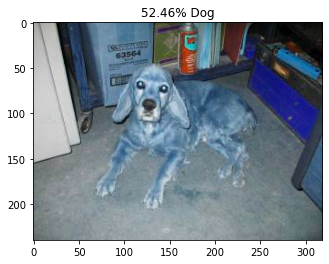

dog\dog.37.jpg


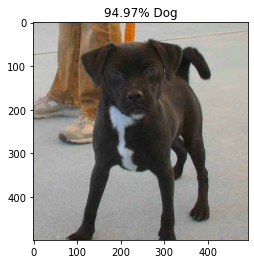

dog\dog.38.jpg


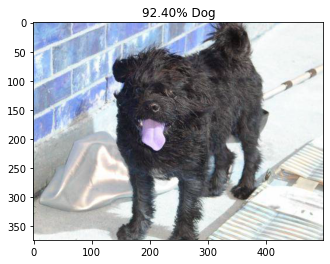

dog\dog.39.jpg


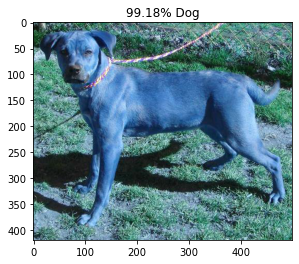

dog\dog.4.jpg


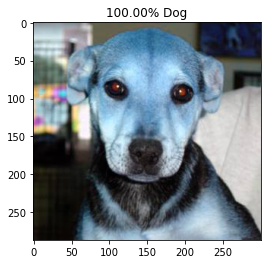

dog\dog.40.jpg


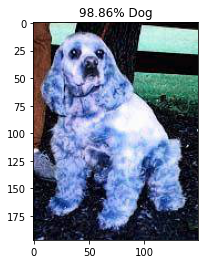

dog\dog.41.jpg


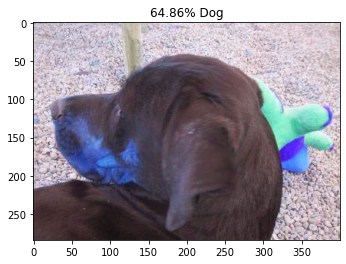

dog\dog.42.jpg


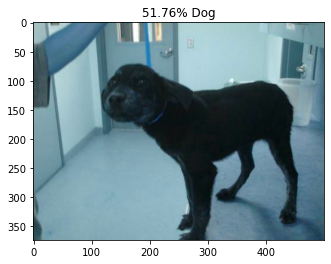

dog\dog.43.jpg


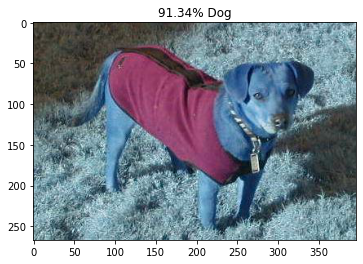

dog\dog.44.jpg


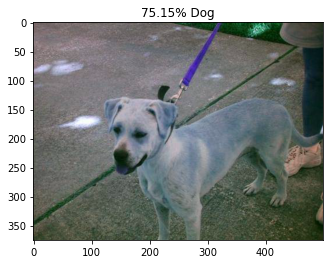

dog\dog.45.jpg


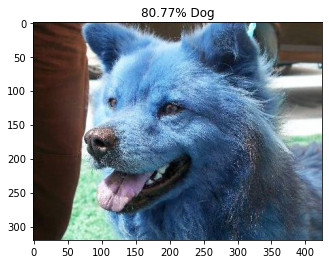

dog\dog.46.jpg


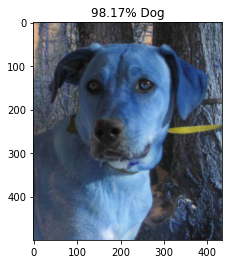

dog\dog.47.jpg


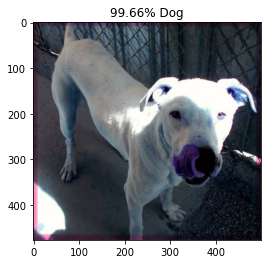

dog\dog.48.jpg


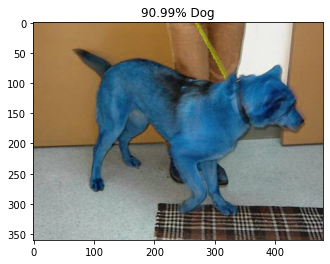

dog\dog.49.jpg


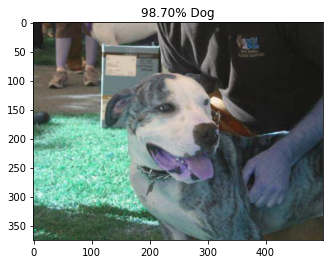

dog\dog.5.jpg


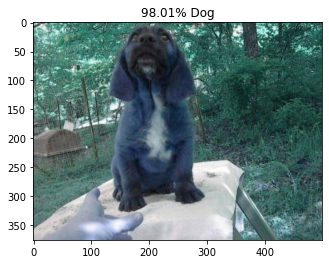

dog\dog.50.jpg


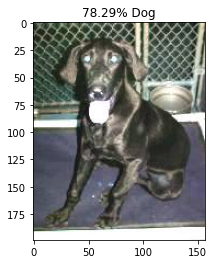

dog\dog.6.jpg


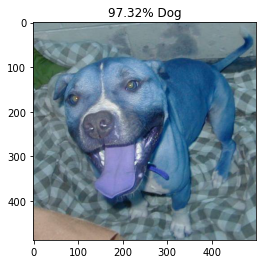

dog\dog.7.jpg


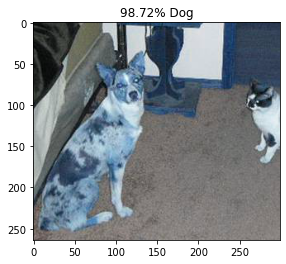

dog\dog.8.jpg


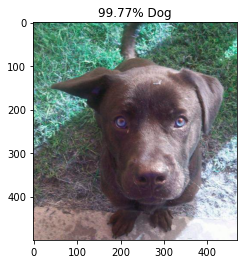

dog\dog.9.jpg


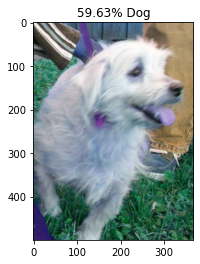

In [48]:
import cv2
import matplotlib.image as mat_image

for index, prob_value in enumerate(predictted):
    image_path = test_datasets + "/"+ test_batches.filenames[index]
    image = mat_image.imread(image_path)
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    pixel = np.array(image)
    plt.imshow(pixel)
    print(test_batches.filenames[index])
    
    if prob_value > 0.5:
        plt.title("%.2f" % (prob_value[0]*100) + "% Dog")
    else:
        plt.title("%.2f" % ((1 - prob_value[0])*100) + "% Cat")
        
    plt.show()